<a href="https://colab.research.google.com/github/ahmedwalidahmad-debug/car-type-classification/blob/main/ai_skills_project_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import kagglehub

# تحميل الداتاسيت
print("جاري تحميل الداتاسيت...")
path = kagglehub.dataset_download("eduardo4jesus/stanford-cars-dataset")
print("مسار الداتاسيت:", path)

# استكشاف محتويات المجلد لمعرفة المسارات الصحيحة
print("\nمحتويات المجلد الرئيسي:")
for item in os.listdir(path):
    item_path = os.path.join(path, item)
    if os.path.isdir(item_path):
        print(f"مجلد: {item}")
        # عرض محتويات المجلدات الفرعية
        sub_items = os.listdir(item_path)
        for sub_item in sub_items:
            print(f"  - {sub_item}")
    else:
        print(f"ملف: {item}")

# البحث عن ملفات الـ annotations
print("\nالبحث عن ملفات الـ annotations:")
devkit_path = None
for root, dirs, files in os.walk(path):
    for file in files:
        if 'cars_train_annos' in file or 'cars_test_annos' in file:
            print(f"تم العثور على ملف annotations: {os.path.join(root, file)}")

# إذا كانت الملفات موجودة في مجلد devkit، حدد المسار الصحيح
possible_devkit_paths = []
for root, dirs, files in os.walk(path):
    if 'devkit' in root.lower():
        possible_devkit_paths.append(root)
        print(f"تم العثور على مجلد devkit: {root}")

print(f"عدد مجلدات devkit الموجودة: {len(possible_devkit_paths)}")

جاري تحميل الداتاسيت...
Using Colab cache for faster access to the 'stanford-cars-dataset' dataset.
مسار الداتاسيت: /kaggle/input/stanford-cars-dataset

محتويات المجلد الرئيسي:
مجلد: cars_test
  - cars_test
مجلد: car_devkit
  - devkit
مجلد: cars_train
  - cars_train

البحث عن ملفات الـ annotations:
تم العثور على ملف annotations: /kaggle/input/stanford-cars-dataset/car_devkit/devkit/cars_test_annos.mat
تم العثور على ملف annotations: /kaggle/input/stanford-cars-dataset/car_devkit/devkit/cars_train_annos.mat
تم العثور على مجلد devkit: /kaggle/input/stanford-cars-dataset/car_devkit
تم العثور على مجلد devkit: /kaggle/input/stanford-cars-dataset/car_devkit/devkit
عدد مجلدات devkit الموجودة: 2


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.io import loadmat
import kagglehub

# تحميل الداتاسيت
path = kagglehub.dataset_download("eduardo4jesus/stanford-cars-dataset")
print("مسار الداتاسيت:", path)

# تحديد المسارات الصحيحة لملفات الـ annotations
# بناءً على محتويات مجلد الداتاسيت كما تم استكشافه سابقًا، المسار الفعلي هو 'path/car_devkit/devkit'
base_devkit_path = os.path.join(path, 'car_devkit', 'devkit')

train_annos_path = os.path.join(base_devkit_path, 'cars_train_annos.mat')
test_annos_path = os.path.join(base_devkit_path, 'cars_test_annos.mat') # هذا الملف لا يحتوي على تصنيفات الفئات

# تحميل ملفات الـ annotations
print("جاري تحميل ملفات الـ annotations...")
train_annos = loadmat(train_annos_path)
test_annos = loadmat(test_annos_path)

print(f"عدد العينات في التدريب: {len(train_annos['annotations'][0])}")
print(f"عدد العينات في الاختبار: {len(test_annos['annotations'][0])}")

# إنشاء DataFrame للتدريب
train_data = []
for i in range(len(train_annos['annotations'][0])):
    ann = train_annos['annotations'][0][i]
    # في ملفات الـ annotations للتدريب، ann[5] هو اسم الملف و ann[4] هو معرف الفئة
    filename_id = ann[5][0]
    # تم تعديل المسار ليشمل المجلد المتداخل 'cars_train'
    filename = os.path.join(path, 'cars_train', 'cars_train', filename_id)
    class_id = ann[4][0][0] - 1  # تحويل من 1-196 إلى 0-195
    train_data.append({'filename': filename, 'class_id': class_id})

train_df = pd.DataFrame(train_data)

# إنشاء DataFrame للاختبار
test_data = []
for i in range(len(test_annos['annotations'][0])):
    ann = test_annos['annotations'][0][i]
    # في ملفات الـ annotations للاختبار، ann[4] هو اسم الملف، ولا توجد فئات (class_id)
    filename_id = ann[4][0]
    # تم تعديل المسار ليشمل المجلد المتداخل 'cars_test'
    filename = os.path.join(path, 'cars_test', 'cars_test', filename_id)
    # لا توجد معلومات عن الفئة في ملف cars_test_annos.mat، لذا نتركها NaN أو None
    test_data.append({'filename': filename, 'class_id': np.nan}) # استخدام np.nan للفئات غير المتوفرة

test_df = pd.DataFrame(test_data)

print(f"شكل DataFrame التدريب: {train_df.shape}")
print(f"شكل DataFrame الاختبار: {test_df.shape}")
print(f"عدد الفئات في بيانات التدريب: {train_df['class_id'].nunique()}")
print(f"عدد الفئات في بيانات الاختبار (غير متوفرة): {test_df['class_id'].nunique()}")

# التحقق من وجود بعض الملفات
print("\nالتحقق من وجود بعض ملفات الصور:")
sample_files_train = train_df['filename'].head(5).tolist()
print("ملفات التدريب:")
for file_path in sample_files_train:
    exists = os.path.exists(file_path)
    print(f"الملف موجود: {file_path} -> {exists}")

sample_files_test = test_df['filename'].head(5).tolist()
print("ملفات الاختبار:")
for file_path in sample_files_test:
    exists = os.path.exists(file_path)
    print(f"الملف موجود: {file_path} -> {exists}")

Using Colab cache for faster access to the 'stanford-cars-dataset' dataset.
مسار الداتاسيت: /kaggle/input/stanford-cars-dataset
جاري تحميل ملفات الـ annotations...
عدد العينات في التدريب: 8144
عدد العينات في الاختبار: 8041
شكل DataFrame التدريب: (8144, 2)
شكل DataFrame الاختبار: (8041, 2)
عدد الفئات في بيانات التدريب: 196
عدد الفئات في بيانات الاختبار (غير متوفرة): 0

التحقق من وجود بعض ملفات الصور:
ملفات التدريب:
الملف موجود: /kaggle/input/stanford-cars-dataset/cars_train/cars_train/00001.jpg -> True
الملف موجود: /kaggle/input/stanford-cars-dataset/cars_train/cars_train/00002.jpg -> True
الملف موجود: /kaggle/input/stanford-cars-dataset/cars_train/cars_train/00003.jpg -> True
الملف موجود: /kaggle/input/stanford-cars-dataset/cars_train/cars_train/00004.jpg -> True
الملف موجود: /kaggle/input/stanford-cars-dataset/cars_train/cars_train/00005.jpg -> True
ملفات الاختبار:
الملف موجود: /kaggle/input/stanford-cars-dataset/cars_test/cars_test/00001.jpg -> True
الملف موجود: /kaggle/input/stanfor

تم تحميل أسماء الفئات بنجاح
عدد الفئات: 196
أول 10 أسماء للفئات:
Class 0: AM General Hummer SUV 2000
Class 1: Acura RL Sedan 2012
Class 2: Acura TL Sedan 2012
Class 3: Acura TL Type-S 2008
Class 4: Acura TSX Sedan 2012
Class 5: Acura Integra Type R 2001
Class 6: Acura ZDX Hatchback 2012
Class 7: Aston Martin V8 Vantage Convertible 2012
Class 8: Aston Martin V8 Vantage Coupe 2012
Class 9: Aston Martin Virage Convertible 2012
عرض عينات من البيانات مع أسماء السيارات:


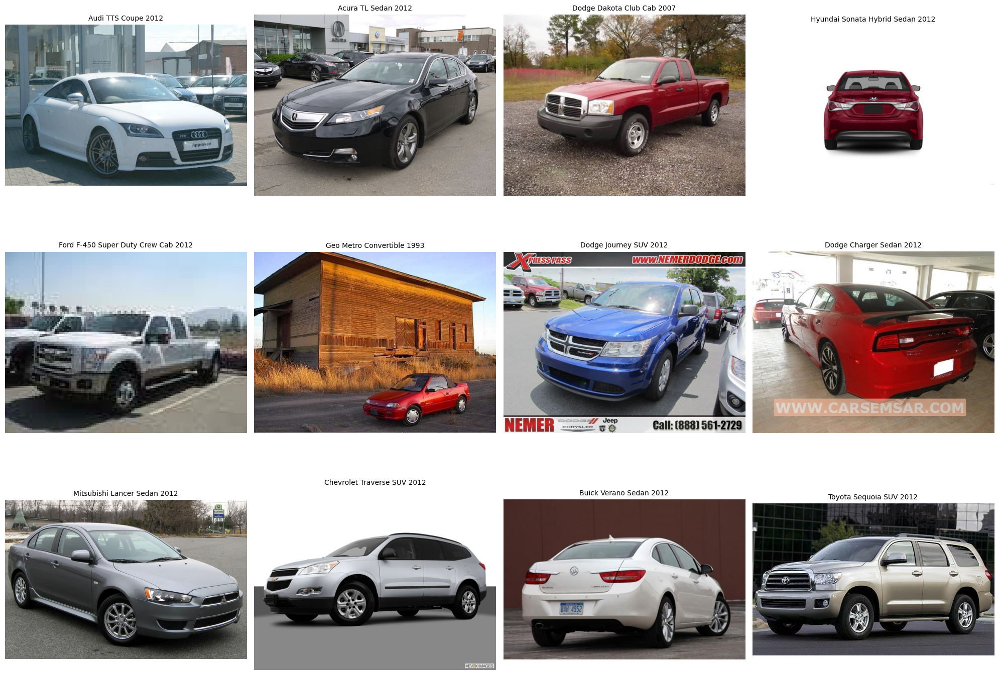

Number of training samples: 8144
Number of test samples: 8041
Number of classes: 196


In [ ]:
from scipy.io import loadmat

# تحميل ملف أسماء الفئات من devkit
classes_path = os.path.join(path, 'car_devkit', 'devkit', 'cars_meta.mat')
classes_mat = loadmat(classes_path)

# استخراج أسماء الفئات
class_names = classes_mat['class_names'][0]

# إنشاء قاموس لتحويل رقم الفئة إلى اسم السيارة
class_name_dict = {}
for i in range(len(class_names)):
    # تم التعديل هنا: الوصول مباشرة إلى اسم الفئة الصحيح
    class_name = class_names[i][0] # استخراج النص من الهيكل المتداخل
    class_name_dict[i] = class_name

print("تم تحميل أسماء الفئات بنجاح")
print("عدد الفئات:", len(class_name_dict))
print("أول 10 أسماء للفئات:")
for i in range(10):
    print(f"Class {i}: {class_name_dict[i]}")

# عرض الصور مع أسماء السيارات
print("عرض عينات من البيانات مع أسماء السيارات:")

fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.ravel()

for i in range(12):
    img_path = train_df.iloc[i]['filename']
    class_id = train_df.iloc[i]['class_id']

    # الحصول على اسم السيارة
    car_name = class_name_dict[class_id]

    img = plt.imread(img_path)
    axes[i].imshow(img)
    axes[i].set_title(car_name, fontsize=10)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# عرض بعض المعلومات الأساسية
print(f"Number of training samples: {len(train_df)}")
print(f"Number of test samples: {len(test_df)}")
print(f"Number of classes: {len(class_name_dict)}")

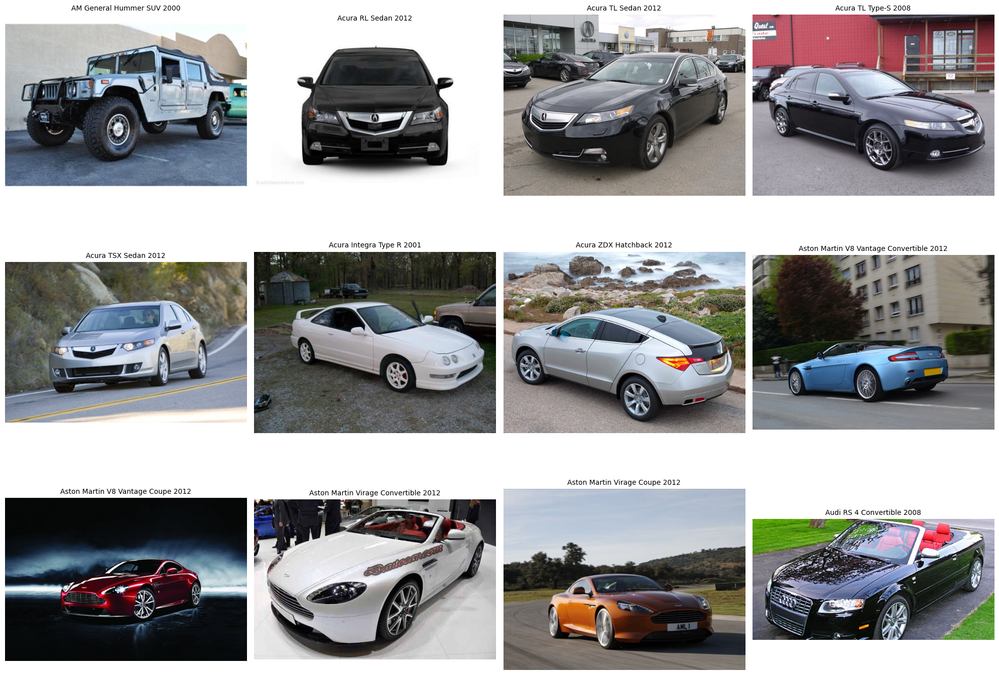

In [ ]:
# عرض صورة واحدة من كل من أول 12 فئة
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.ravel()

for class_id in range(12):
    class_samples = train_df[train_df['class_id'] == class_id]
    if len(class_samples) > 0:
        img_path = class_samples.iloc[0]['filename']
        img = plt.imread(img_path)
        axes[class_id].imshow(img)
        car_name = class_name_dict[class_id]
        axes[class_id].set_title(car_name, fontsize=10)
        axes[class_id].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

# بما أن ملف الاختبار لا يحتوي على تسميات الفئات، سنقسم train_df إلى train و validation sets
train_split, validation_split = train_test_split(
    train_df, test_size=0.2, stratify=train_df['class_id'], random_state=42
)

print(f"عدد العينات في train_split: {len(train_split)}")
print(f"عدد العينات في validation_split: {len(validation_split)}")

# إنشاء القاموس لتحويل الفئات إلى نصوص باستخدام train_df فقط
# تأكد أن class_id في train_df هي أرقام صحيحة لإنشاء أسماء فئات متسقة
all_class_ids = sorted(train_df['class_id'].unique())
class_to_string = {cls: f"class_{int(cls)}" for cls in all_class_ids}

# تطبيق التحويل على كل من train_split و validation_split
train_split['class_id_str'] = train_split['class_id'].map(class_to_string)
validation_split['class_id_str'] = validation_split['class_id'].map(class_to_string)

# التحقق من التحويل
print(f"عدد الفئات الفريدة في train_split['class_id_str']: {train_split['class_id_str'].nunique()}")
print(f"عدد الفئات الفريدة في validation_split['class_id_str']: {validation_split['class_id_str'].nunique()}")
print(f"هل توجد قيم مفقودة في train_split['class_id_str']: {train_split['class_id_str'].isnull().sum()}")
print(f"هل توجد قيم مفقودة في validation_split['class_id_str']: {validation_split['class_id_str'].isnull().sum()}")

عدد العينات في train_split: 6515
عدد العينات في validation_split: 1629
عدد الفئات الفريدة في train_split['class_id_str']: 196
عدد الفئات الفريدة في validation_split['class_id_str']: 196
هل توجد قيم مفقودة في train_split['class_id_str']: 0
هل توجد قيم مفقودة في validation_split['class_id_str']: 0


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# إعداد ImageDataGenerator للتدريب مع Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# إعداد ImageDataGenerator للتحقق
validation_datagen = ImageDataGenerator(rescale=1./255)

# تحديد المعاملات
batch_size = 32
img_height, img_width = 224, 224

# إنشاء Data Generators
train_generator = train_datagen.flow_from_dataframe(
    train_split,
    x_col='filename',
    y_col='class_id_str',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

validation_generator = validation_datagen.flow_from_dataframe(
    validation_split,
    x_col='filename',
    y_col='class_id_str',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# التحقق من إعداد Data Generators بطريقة مختلفة
print("تم إنشاء Data Generators بنجاح")

# التحقق من عدد الفئات باستخدام الرسائل التي يطبعها flow_from_dataframe
# أو باستخدام class_indices
print(f"عدد العينات في التدريب: {train_generator.samples}")
print(f"عدد العينات في التحقق: {validation_generator.samples}")

# التحقق من عدد الفئات باستخدام class_indices
num_classes = len(train_generator.class_indices)
print(f"عدد الفئات: {num_classes}")

# طباعة بعض المعلومات الإضافية للتحقق
print(f"مفاتيح class_indices: {list(train_generator.class_indices.keys())[:10]}...")  # أول 10 فئات
print(f"عدد الفئات في class_indices: {len(train_generator.class_indices)}")

# التحقق من أن كلا الـ generators يعملان بشكل صحيح
print("\nالتحقق من عمل الـ generators:")
try:
    # محاولة استخراج دفعة واحدة من كل generator
    train_batch_x, train_batch_y = next(train_generator)
    validation_batch_x, validation_batch_y = next(validation_generator)

    print(f"تم استخراج دفعة من train_generator بنجاح. شكل الدفعة: {train_batch_x.shape}")
    print(f"شكل تسميات الدفعة: {train_batch_y.shape}")
    print(f"عدد الفئات في تسميات الدفعة: {train_batch_y.shape[1]}")

except Exception as e:
    print(f"خطأ في استخراج الدفعة: {e}")

Found 6515 validated image filenames belonging to 196 classes.
Found 1629 validated image filenames belonging to 196 classes.
تم إنشاء Data Generators بنجاح
عدد العينات في التدريب: 6515
عدد العينات في التحقق: 1629
عدد الفئات: 196
مفاتيح class_indices: ['class_0', 'class_1', 'class_10', 'class_100', 'class_101', 'class_102', 'class_103', 'class_104', 'class_105', 'class_106']...
عدد الفئات في class_indices: 196

التحقق من عمل الـ generators:
تم استخراج دفعة من train_generator بنجاح. شكل الدفعة: (32, 224, 224, 3)
شكل تسميات الدفعة: (32, 196)
عدد الفئات في تسميات الدفعة: 196


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# إعداد ImageDataGenerator للتدريب مع Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# إعداد ImageDataGenerator للتحقق
validation_datagen = ImageDataGenerator(rescale=1./255)

# تحديد المعاملات
batch_size = 32
img_height, img_width = 224, 224

# إنشاء Data Generators
train_generator = train_datagen.flow_from_dataframe(
    train_split,
    x_col='filename',
    y_col='class_id_str',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

validation_generator = validation_datagen.flow_from_dataframe(
    validation_split,
    x_col='filename',
    y_col='class_id_str',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# التحقق من إعداد Data Generators بطريقة مختلفة
print("تم إنشاء Data Generators بنجاح")

# التحقق من عدد الفئات باستخدام الرسائل التي يطبعها flow_from_dataframe
# أو باستخدام class_indices
print(f"عدد العينات في التدريب: {train_generator.samples}")
print(f"عدد العينات في التحقق: {validation_generator.samples}")

# التحقق من عدد الفئات باستخدام class_indices
num_classes = len(train_generator.class_indices)
print(f"عدد الفئات: {num_classes}")

# طباعة بعض المعلومات الإضافية للتحقق
print(f"مفاتيح class_indices: {list(train_generator.class_indices.keys())[:10]}...")  # أول 10 فئات
print(f"عدد الفئات في class_indices: {len(train_generator.class_indices)}")

# التحقق من أن كلا الـ generators يعملان بشكل صحيح
print("\nالتحقق من عمل الـ generators:")
try:
    # محاولة استخراج دفعة واحدة من كل generator
    train_batch_x, train_batch_y = next(train_generator)
    validation_batch_x, validation_batch_y = next(validation_generator)

    print(f"تم استخراج دفعة من train_generator بنجاح. شكل الدفعة: {train_batch_x.shape}")
    print(f"شكل تسميات الدفعة: {train_batch_y.shape}")
    print(f"عدد الفئات في تسميات الدفعة: {train_batch_y.shape[1]}")

except Exception as e:
    print(f"خطأ في استخراج الدفعة: {e}")

Found 6515 validated image filenames belonging to 196 classes.
Found 1629 validated image filenames belonging to 196 classes.
تم إنشاء Data Generators بنجاح
عدد العينات في التدريب: 6515
عدد العينات في التحقق: 1629
عدد الفئات: 196
مفاتيح class_indices: ['class_0', 'class_1', 'class_10', 'class_100', 'class_101', 'class_102', 'class_103', 'class_104', 'class_105', 'class_106']...
عدد الفئات في class_indices: 196

التحقق من عمل الـ generators:
تم استخراج دفعة من train_generator بنجاح. شكل الدفعة: (32, 224, 224, 3)
شكل تسميات الدفعة: (32, 196)
عدد الفئات في تسميات الدفعة: 196


Verification of preprocessing:
Pixel value range in the batch: [0.000, 1.000]


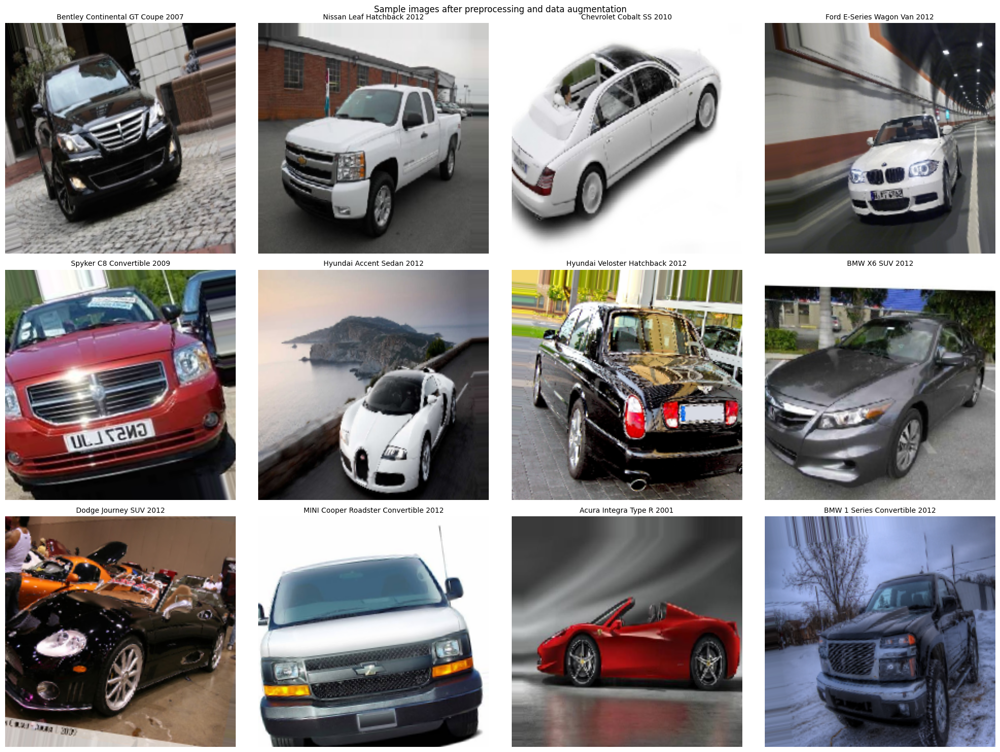

In [ ]:
from scipy.io import loadmat

# تحميل أسماء الفئات من ملف cars_meta.mat
classes_path = os.path.join(path, 'car_devkit', 'devkit', 'cars_meta.mat')
classes_mat = loadmat(classes_path)
class_names = classes_mat['class_names'][0]

# إنشاء قاموس لتحويل رقم الفئة إلى اسم السيارة
class_name_dict = {}
for i in range(len(class_names)):
    class_name = class_names[i][0] # Corrected: Access element at index 0
    class_name_dict[i] = class_name # Removed .decode('utf-8') as it's already a string

# الآن عرض العينات مع أسماء السيارات الفعلية
print("Verification of preprocessing:")

# استخراج دفعة واحدة من train_generator
sample_batch_x, sample_batch_y = next(train_generator)

# التحقق من نطاق قيم البكسل بعد التطبيع
print(f"Pixel value range in the batch: [{sample_batch_x.min():.3f}, {sample_batch_x.max():.3f}]")

# عرض العينات مع أسماء السيارات
plt.figure(figsize=(20, 15))
for i in range(12):
    plt.subplot(3, 4, i+1)
    plt.imshow(sample_batch_x[i])
    predicted_class_idx = np.argmax(sample_batch_y[i])
    car_name = class_name_dict[predicted_class_idx]  # استخدام اسم السيارة الفعلي
    plt.title(car_name, fontsize=10)
    plt.axis('off')

plt.suptitle('Sample images after preprocessing and data augmentation')
plt.tight_layout()
plt.show()

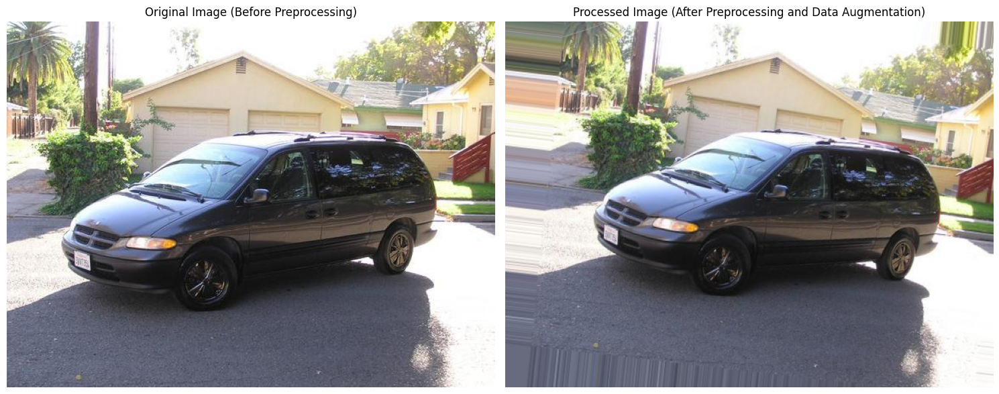

Original image pixel range: [0, 255]
Processed image pixel range: [0.004, 1.000]
Original image shape: (431, 575, 3)
Processed image shape: (431, 575, 3)

عرض عدة أزواج من الصور الأصلية والمعالجة:


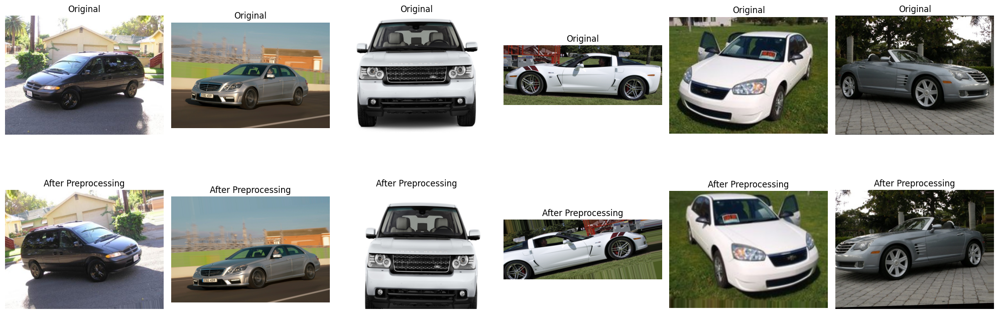

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.utils import img_to_array

# اختيار صورة واحدة للمقارنة
sample_index = 0  # يمكن تغيير هذا الرقم لاختيار صورة مختلفة

# تحميل الصورة الأصلية قبل أي معالجة
original_image_path = train_split.iloc[sample_index]['filename']
original_image = plt.imread(original_image_path) # Loads as uint8, 0-255

# استخراج نفس الصورة بعد المعالجة المسبقة من train_generator
# بدلاً من محاولة استخراجها من الـ generator (الذي يقوم بالشقلبة والتحويل)،
# سنطبق التحويلات مباشرة على الصورة الأصلية.
# يجب تحويل الصورة إلى تنسيق يتوقعه ImageDataGenerator (height, width, channels)
original_image_array = img_to_array(original_image)

# تطبيق التحويلات العشوائية (augmentation) من train_datagen
# ملاحظة: random_transform لا يطبق rescaling، لذا يجب تطبيقها يدوياً
processed_image_array = train_datagen.random_transform(original_image_array)
processed_image = processed_image_array * (1./255) # تطبيق rescaling يدوياً

# عرض الصورة الأصلية وبعد المعالجة جنباً إلى جنب
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image (Before Preprocessing)')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(processed_image)
plt.title('Processed Image (After Preprocessing and Data Augmentation)')
plt.axis('off')

plt.tight_layout()
plt.show()

# طباعة معلومات إضافية للمقارنة
print(f"Original image pixel range: [{original_image.min():.0f}, {original_image.max():.0f}]")
print(f"Processed image pixel range: [{processed_image.min():.3f}, {processed_image.max():.3f}]")
print(f"Original image shape: {original_image.shape}")
print(f"Processed image shape: {processed_image.shape}")

# عرض عدة أزواج من الصور الأصلية والمعالجة
print("\nعرض عدة أزواج من الصور الأصلية والمعالجة:")
fig, axes = plt.subplots(2, 6, figsize=(20, 8))

for i in range(6):
    # تحميل الصورة الأصلية
    original_image_path_multi = train_split.iloc[i]['filename']
    original_image_multi = plt.imread(original_image_path_multi)

    # تحويل وتطبيق التحويلات
    original_image_array_multi = img_to_array(original_image_multi)
    processed_image_array_multi = train_datagen.random_transform(original_image_array_multi)
    processed_image_multi = processed_image_array_multi * (1./255)

    # عرض الصور جنباً إلى جنب
    axes[0, i].imshow(original_image_multi)
    axes[0, i].set_title('Original')
    axes[0, i].axis('off')

    axes[1, i].imshow(processed_image_multi)  # الصورة المعالجة
    axes[1, i].set_title('After Preprocessing')
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

IMG_SIZE = (299, 299)
NUM_CLASSES = 196

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 299, 299,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 149, 149,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 149, 149,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 149, 149,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 147, 147,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 147, 147,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 73, 73,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 73, 73,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 73, 73,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 73, 73,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 71, 71,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 71, 71,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 71, 71,    │          0 │ batch_normalizat

 Total params: 24,101,860 (91.94 MB)

 Trainable params: 2,299,076 (8.77 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import json
import kagglehub

# تحميل الداتاسيت لضمان تعريف 'path' (تمت إضافته لإصلاح NameError)
path = kagglehub.dataset_download("eduardo4jesus/stanford-cars-dataset")

# مجلد التدريب (يحتوي على صور التدريب)
TRAIN_DIR = os.path.join(path, 'cars_train', 'cars_train')

# مجلد الاختبار (يحتوي على صور الاختبار)
TEST_DIR = os.path.join(path, 'cars_test', 'cars_test')

#TRAIN_DIR = '/path/to/stanford_cars/train'
#TEST_DIR = '/path/to/stanford_cars/test'
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20, width_shift_range=0.2, height_shift_range=0.2, shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest')
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_dataframe(
    train_split,
    x_col='filename',
    y_col='class_id_str',  # أو 'class_id' إذا حابة تستخدم الأرقام
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

validation_generator = test_datagen.flow_from_dataframe(
    validation_split,
    x_col='filename',
    y_col='class_id_str',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)


history = model.fit(
    train_generator,
    epochs=15,
    validation_data=validation_generator
)

model.save_weights('inception_cars_transfer_weights.weights.h5')

with open('inception_cars_history.json', 'w') as f:
    json.dump(history.history, f)

#history = model.fit(train_generator, steps_per_epoch=train_generator.samples // BATCH_SIZE, validation_data=validation_generator, validation_steps=validation_generator.samples // BATCH_SIZE, epochs=15)

#model.save_weights('inception_cars_transfer_weights.h5')
#with open('inception_cars_history.json', 'w') as f:
    #json.dump(history.history, f)


    #model.save_weights('inception_cars_transfer_weights.weights.h5')

#with open('inception_cars_history.json', 'w') as f:
    #json.dump(history.history, f)


Using Colab cache for faster access to the 'stanford-cars-dataset' dataset.


NameError: name 'train_split' is not defined

In [ ]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import json
import kagglehub
import pandas as pd # Added for train_df and validation_split
from sklearn.model_selection import train_test_split # Added for train_test_split
import tensorflow as tf # Added for model definition
from tensorflow.keras.applications import InceptionV3 # Added for model definition
from tensorflow.keras.models import Model # Added for model definition
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D # Added for model definition
from tensorflow.keras.optimizers import Adam # Added for model definition
from scipy.io import loadmat # Added for train_df dependencies
import numpy as np # Added for train_df dependencies

# Re-download dataset to ensure 'path' is defined, if kernel was restarted
path = kagglehub.dataset_download("eduardo4jesus/stanford-cars-dataset")

# Re-create train_df and test_df if they are not defined (from cell lFM27oP4qoKC)
base_devkit_path = os.path.join(path, 'car_devkit', 'devkit')
train_annos_path = os.path.join(base_devkit_path, 'cars_train_annos.mat')
test_annos_path = os.path.join(base_devkit_path, 'cars_test_annos.mat')

train_annos = loadmat(train_annos_path)
test_annos = loadmat(test_annos_path)

train_data = []
for i in range(len(train_annos['annotations'][0])):
    ann = train_annos['annotations'][0][i]
    filename_id = ann[5][0]
    filename = os.path.join(path, 'cars_train', 'cars_train', filename_id)
    class_id = ann[4][0][0] - 1
    train_data.append({'filename': filename, 'class_id': class_id})
train_df = pd.DataFrame(train_data)

test_data = []
for i in range(len(test_annos['annotations'][0])):
    ann = test_annos['annotations'][0][i]
    filename_id = ann[4][0]
    filename = os.path.join(path, 'cars_test', 'cars_test', filename_id)
    test_data.append({'filename': filename, 'class_id': np.nan})
test_df = pd.DataFrame(test_data)


# Re-create train_split and validation_split (from cell AxFIqIvkzU3I)
train_split, validation_split = train_test_split(
    train_df, test_size=0.2, stratify=train_df['class_id'], random_state=42
)

all_class_ids = sorted(train_df['class_id'].unique())
class_to_string = {cls: f"class_{int(cls)}" for cls in all_class_ids}

train_split['class_id_str'] = train_split['class_id'].map(class_to_string)
validation_split['class_id_str'] = validation_split['class_id'].map(class_to_string)

# Re-define IMG_SIZE, NUM_CLASSES, and model (from cell kJcV0brU2BG2)
IMG_SIZE = (299, 299)
NUM_CLASSES = 196

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# مجلد التدريب (يحتوي على صور التدريب)
TRAIN_DIR = os.path.join(path, 'cars_train', 'cars_train')

# مجلد الاختبار (يحتوي على صور الاختبار)
TEST_DIR = os.path.join(path, 'cars_test', 'cars_test')

BATCH_SIZE = 32

# Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Generators
train_generator = train_datagen.flow_from_dataframe(
    train_split,
    x_col='filename',
    y_col='class_id_str',   # لو عندك رقم استخدمي class_id
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

validation_generator = test_datagen.flow_from_dataframe(
    validation_split,
    x_col='filename',
    y_col='class_id_str',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Train
history = model.fit(
    train_generator,
    epochs=15,
    validation_data=validation_generator
)

# Save Weights
model.save_weights('inception_cars_transfer_weights.weights.h5')

# Save History
with open('inception_cars_history.json', 'w') as f:
    json.dump(history.history, f)


Using Colab cache for faster access to the 'stanford-cars-dataset' dataset.
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Found 6515 validated image filenames belonging to 196 classes.
Found 1629 validated image filenames belonging to 196 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
204/204 ━━━━━━━━━━━━━━━━━━━━ 2220s 11s/step - accuracy: 0.0294 - loss: 5.0408 - val_accuracy: 0.1050 - val_loss: 3.8461
Epoch 2/15
141/204 ━━━━━━━━━━━━━━━━━━━━ 9:07 9s/step - accuracy: 0.1031 - loss: 3.8967